# Kalman gain plots (Kind of Averaging Kernels)

- Wallpaper kind of plots: For each model (row) plot kalman gain for each location to temperature and precipitation

- The idea is to plot how much each location is affected by the other proxies. However, the pure Kalman gain could be a bit misleading because of different signs (positive and negative covariances cancelling each other). Thus I use the absolute value of the covariances/absolute value of the Kalman Gain.

$$
|K| = \frac{|cov(X,HX)|}{cov(HX,HX)+R} (N_x \times N_y)
$$

- The absolute Kalman gain is then summed up for all observations (I could also compute the median, but probably better to sum up, to get the overall influence on each gridbox).
- the covariances are compute for the whole dataset
- the proxy error is set generously to 0.5


In [2]:
import sys
sys.path.append('/home/mchoblet/paleoda')
import xarray as xr
import numpy as np

from types import SimpleNamespace

import os
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import cartopy.crs as ccrs
from scipy.stats import linregress
from cartopy.util import add_cyclic_point
import cartopy.feature as cfeature  
from matplotlib.offsetbox import AnchoredText    

import warnings

import psm_pseudoproxy
import utils 
import evaluation

from scipy import stats
from matplotlib import ticker

%load_ext autoreload
%autoreload 2

In [3]:
import pickle

In [4]:
#redux version of config dictionary

###CONFIG DICTIONARY

#lists are sometimes necessary, especially if we use multiple proxy-DBs (e.g. SISAL and iso2k)
#and multiple timescales

cfg={
'vp':{
'd18O':'/home/mchoblet/paleoda/data/model_data/ECHAM5_d18O_850_1849.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/ECHAM5_prec_850_1849.nc',
'tsurf': '/home/mchoblet/paleoda/data/model_data/ECHAM5_tsurf_850_1849.nc',
'evap': '/home/mchoblet/paleoda/data/model_data/ECHAM5_evap_850_1849.nc',
'slp': None,
},
'avg':None,
'oro': '/home/mchoblet/paleoda/data/orographies/echam_oro.nc',
'obsdata':['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc','/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc'],
'only_regional_proxies':False,
'regional_bounds':False,
'obs_var':[['d18O','d18O_precision'],['d18O','d18O_precision']], #name of variables and uncertainties in proxy_db files
'proxy_error': [0.1,0.1], #irrelevant for PPE
'time_scales': ['median','median'],
'proxy_time':['0000','2015'],
'time': ['0000','2015'],
'resample': True,
'resample_mode': 'nearest',
'mask': 3, 
###MULTI-TIMESCALE
#'timescales':[1,5,10,20], #list of timescales (have to be true divisors of longest timescale (block size)) Timescale 1 always required! 
'timescales':[1,3,6,12,24], #list of timescales (have to be true divisors of longest timescale (block size)) Timescale 1 always required! 
'reuse': True,
'ppe': {'use':False},
'check_nan': False,
'reconstruct':['tsurf','d18O','prec']
}


cfg['psm']=['speleo','icecore']
cfg['interpol']=None
cfg['var_psm']=['d18O','d18O'] #only relevant if psm=None  
cfg['speleo']={
    'weighting':'inf', #None(pure d18O) / prec (d180 prec weighted)/ inf (d18O prec-evap weighted)
    'height': True, #height correction: True requires orography of model + proxy_db must have a coordinate 'elev'. Lapse rate assumed -0.28 for isotopes and -0.65 for temperature
    'fractionation':True, #requires tsurf (in 'vp')
    'fractionation_temp': 'regular', #'mean'
    'filter': False, #True: convolution of yearly means with 2.5 year transit time, or float: transit time
    't_time': 2.5, #if filter equal true, use this as a transit time
}
cfg['icecore']={
    'weighting':'prec', #None(pure d18O) / prec (d180 prec weighted)
    'height': True, #height correction: True requires orography of model and 'elev' coordinate for proxy_db. Requires that proxy_db has a coordinate 'lapse rate' (e.g. i attributed -0.15 to non polar porxies and -0.28 to polar ones (per 100m)
    'filter': False, #If True the PSM-function from PRYSM which takes into account diffusion is applied. 
}

In [5]:
paths={
    'Echam':{'d18O':'/home/mchoblet/paleoda/data/model_data/ECHAM5_d18O_850_1849.nc',
'evap':'/home/mchoblet/paleoda/data/model_data/ECHAM5_evap_850_1849.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/ECHAM5_prec_850_1849.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/ECHAM5_tsurf_850_1849.nc',
       },
'iCESM':{'d18O':'/home/mchoblet/paleoda/data/model_data/CESM_d18O_850_1850.nc',
'evap':'/home/mchoblet/paleoda/data/model_data/CESM_evap_850_1850.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/CESM_prec_850_1850.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/CESM_tsurf_850_1850.nc',
       },
'isoGSM':{'d18O':'/home/mchoblet/paleoda/data/model_data/CCSM_d18O_851_1850.nc',
'evap':'/home/mchoblet/paleoda/data/model_data/CCSM_evap_851_1850.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/CCSM_prec_851_1850.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/CCSM_tsurf_851_1850.nc',
       },    
'GISS':{'d18O':'/home/mchoblet/paleoda/data/model_data/GISS_d18O_850_1849.nc',
'evap':'/home/mchoblet/paleoda/data/model_data/GISS_evap_850_1849.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/GISS_prec_850_1849.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/GISS_tsurf_850_1849.nc',
'slp': '/home/mchoblet/paleoda/data/model_data/GISS_slp_850_1849.nc',
       },
'iHadCM3':{'d18O':'/home/mchoblet/paleoda/data/model_data/iHADCM3_d18O_801_1952.nc',
'evap':'/home/mchoblet/paleoda/data/model_data/iHADCM3_evap_801_1952.nc',
'prec':'/home/mchoblet/paleoda/data/model_data/iHADCM3_prec_801_1952.nc',
'tsurf':'/home/mchoblet/paleoda/data/model_data/iHADCM3_tsurf_801_1952.nc',
'slp':'/home/mchoblet/paleoda/data/model_data/iHADCM3_slp_801_1952.nc',
       }
} 

#I checked once again that nothing with the longitudes is wrong (all go from 0 to 360)
oro_dic={
'iCESM':'/home/mchoblet/paleoda/data/orographies/icesm_oro.nc',
    'isoGSM':'/home/mchoblet/paleoda/data/orographies/ccsm_oro.nc',
'Echam': '/home/mchoblet/paleoda/data/orographies/echam_oro.nc',
'GISS':'/home/mchoblet/paleoda/data/orographies/giss_oro.nc',
'iHadCM3':'/home/mchoblet/paleoda/data/orographies/hadcm3_oro.nc',
}

In [6]:
def kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1,R=0.1):
    """
    CODE HAS BEEN CHANGED TO COMPUTE THE ABSOLUTE KALMAN GAIN!
    
    Compute kalman gain:
    
    time: resampling frequency (towards lower time resolutions)
    frac: Fraction of Proxy locations to use
    R: Error of proxies (maybe try values between 1 and 0.01, usually 0.1)
    
    1. load prior for all given variables
    2. load proxy locations
    3. Resample model data to higher resolutions
    4. Apply PSM
    5. Compute Correlation distance for each DB
    -> Return Data-Array
    """
    
    c=SimpleNamespace(**cfg)
    #PSM REQUIRES UNRESAMPLED PRIOR!
    HXfull_all=utils.psm_apply(c,prior0,prior_raw, pp_y_all)

    #old options from version where i computed influence on more than annual time scales
    HXfull_all_new=HXfull_all
    #for HX in HXfull_all:
    #    HX=HX.resample(time=time,closed='left').mean()
    #    HXfull_all_new.append(HX)

    HXf_=HXfull_all_new[0]
    if frac!=1:
        rng=np.random.default_rng()
        length=len(HXf_.site)
        HXf_=HXf_[:,rng.choice(length,size=int(length*frac), replace=False)]

    
        
    #HXf is only allowed to have time and site dimension
    HXf=xr.DataArray(HXf_.values,dims=('time','site'))
    HXf['time']=HXf_['time'].values
    HXf['site']=HXf_['site'].values

    kalman_ds=xr.Dataset()

    for v in c.reconstruct:
        print('compute kalman gain')
        Xf=prior[v].stack(z=('lat','lon'))
        #add a mini number first value to avoid nans (especially for precipitation)
        Xf[0,:]+=np.ones(Xf.shape[1])*1e-10
        data=Xf.chunk({'z':250})
        cov=xr.cov(data,HXf,dim='time')

        covH=np.cov(HXf,rowvar=False)
        R_mat=np.diag(np.ones(len(HXf.site))*R)
        denom=covH+R_mat
        denom_inv=np.linalg.inv(denom)
        K=cov.values @ denom_inv
        
        data_array=xr.DataArray(K,coords=dict(z=cov.z,site=HXf.site))
        da_sum=data_array.sum(dim='site')
        da_sum=da_sum.unstack('z')
        
        #sum up the kalman gain(averaging kernel)
        kalman_ds[(str(v)+'_A')]=(('lat','lon'),da_sum.values)
        
        #K=cov.values @ denom_inv
        #K_abs=np.abs(cov.values) @ denom_inv
        #K2=np.abs(K)
        
        #just store the summed up covariance
        data_array=xr.DataArray(cov,coords=dict(z=cov.z,site=HXf.site))
        #import pdb
        #pdb.set_trace()
        
        da_sum=data_array.sum(dim='site')
        da_sum=da_sum.unstack('z')
        
        #sum up the absolute kalman gains
        kalman_ds[(str(v)+'_cov')]=(('lat','lon'),da_sum.values)
       
        """
        data_array2=xr.DataArray(K2,coords=dict(z=cov.z,site=HXf.site))
        da_sum2=data_array2.sum(dim='site')
        da_sum2=da_sum2.unstack('z')
        
        
        kalman_ds[(str(v+'_abs'))]=(('lat','lon'),da_sum2.values)
    
        import pdb
        pdb.set_trace()
        
        #kalman_ds[(str(v))]=(('lat','lon'),da_sum.values)
        """
        try:
            kalman_ds=kalman_ds.drop('z')
        except:
            pass
        
        kalman_ds['lat']=prior.lat.values
        kalman_ds['lon']=prior.lon.values
    return kalman_ds

In [ ]:
models=list(paths.keys())
times=[1]#,5,10,25]

dic_models={}
#loop over models
for m in models:
    model={}
    cfg['vp']=paths[m]
    if m=='iHadCM3':
        cfg['check_nan']=True
    else:
        cfg['check_nan']=False

    c=SimpleNamespace(**cfg)

    #pp_y_all,pp_r_all=utils.proxy_load(c)
    prior0, attributes, prior_raw=utils.prior_preparation(c)
    
    prior=prior0#.resample(closed='left').mean()
        
    time='1YS'

    ###SISAL
    
    #just sisal, no psm
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc']
    cfg['psm']=[None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_nopsm']=c1
    
    #just iso
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc']
    cfg['psm']=[None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['iso_nopsm']=c1
    
    #both
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc','/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc']
    cfg['psm']=[None,None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['both_nopsm']=c1
    
    """
    #add filter
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting':None, 'height': False, 'fractionation':False, 'fractionation_temp': 'regular', 'filter': True, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_filter']=c2

    #add inf weighting
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting':'inf', 'height': False, 'fractionation':False, 'fractionation_temp': 'regular', 'filter': False, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_inf']=c2
    
    #inf weighting + filter
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting':'inf', 'height': False, 'fractionation':False, 'fractionation_temp': 'regular', 'filter': True, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_inf_filter']=c2
    
    # only fractionation
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting': None, 'height': False, 'fractionation':True, 'fractionation_temp': 'regular', 'filter': False, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_frac']=c2
    
    # inf + fractionation
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting': 'inf', 'height': False, 'fractionation':True, 'fractionation_temp': 'regular', 'filter': False, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_frac_inf']=c2
    
    #add full psm
    cfg['psm']=['speleo']
    cfg['speleo']={ 'weighting':'inf', 'height': False, 'fractionation':True, 'fractionation_temp': 'regular', 'filter': True, 't_time': 2.5, }
    c2=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['sisal_all']=c2
    
    ###ISO_2K
    #iso2k, no psm
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc']
    cfg['psm']=[None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c3=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['iso_nopsm']=c3
    
    #iso2k prec
    cfg['psm']=['icecore']
    cfg['icecore']={'weighting': 'prec', 'height': False, 'filter': False}
    c4=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['iso_prec']=c4
    
    #i2o2k filt
    cfg['psm']=['icecore']
    cfg['icecore']={'weighting': None, 'height': False, 'filter': True}
    c4=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['iso_filter']=c4
    
    #i2o2k all
    cfg['psm']=['icecore']
    cfg['icecore']={'weighting': 'prec', 'height': False, 'filter': True}
    c4=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['iso_all']=c4
    #
    
    #both, no psm (should be the sum of both?) (if yes, do not compute this...)
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1600_1800.nc','/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1600_1800.nc']
    cfg['psm']=[None,None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    c5=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['both_nopsm']=c5
    
    #both, with psm
    cfg['psm']=['speleo','icecore']
    cfg['speleo']={ 'weighting':'inf', 'height': False, 'fractionation':True, 'fractionation_temp': 'regular', 'filter': True, 't_time': 2.5, }
    cfg['icecore']={'weighting': 'prec', 'height': False, 'filter': True}
    c6=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['both_fullpsm']=c6
    
    
    #only karst-filter + inf
    cfg['speleo']={ 'weighting':'inf', 'height': False, 'fractionation':False, 'fractionation_temp': 'regular', 'filter': True, 't_time': 2.5, }
    cfg['icecore']={'weighting': 'prec', 'height': False, 'filter': False}
    c5=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1)
    model['both_lightpsm']=c5
    """
    
    #"""
    #dic_times[str(t)]=[c1,c2,c3,c4,c5,c6] #[c1,c2,c3,c4,c5]
    dic_models[m]=model
    
with open('A_and_cov.pkl', 'wb') as f:
    pickle.dump(dic_models, f)

Load d18O  from  /home/mchoblet/paleoda/data/model_data/ECHAM5_d18O_850_1849.nc
computing yearly average
Load evap  from  /home/mchoblet/paleoda/data/model_data/ECHAM5_evap_850_1849.nc
computing yearly average
Load prec  from  /home/mchoblet/paleoda/data/model_data/ECHAM5_prec_850_1849.nc
computing yearly average
Load tsurf  from  /home/mchoblet/paleoda/data/model_data/ECHAM5_tsurf_850_1849.nc
computing yearly average
>>>>>LOADING PROXY DATA
compute kalman gain
compute kalman gain
compute kalman gain
>>>>>LOADING PROXY DATA
compute kalman gain
compute kalman gain
compute kalman gain
>>>>>LOADING PROXY DATA
compute kalman gain
compute kalman gain
compute kalman gain
Load d18O  from  /home/mchoblet/paleoda/data/model_data/CESM_d18O_850_1850.nc
computing yearly average
Load evap  from  /home/mchoblet/paleoda/data/model_data/CESM_evap_850_1850.nc
computing yearly average
Load prec  from  /home/mchoblet/paleoda/data/model_data/CESM_prec_850_1850.nc
computing yearly average
Load tsurf  from 

In [ ]:
models=list(paths.keys())
times=[1]#,5,10,25]

dic_models={}
#loop over models
for m in models:
    model={}
    cfg['vp']=paths[m]
    if m=='iHadCM3':
        cfg['check_nan']=True
    else:
        cfg['check_nan']=False

    c=SimpleNamespace(**cfg)

    #pp_y_all,pp_r_all=utils.proxy_load(c)
    prior0, attributes, prior_raw=utils.prior_preparation(c)
    
    prior=prior0#.resample(closed='left').mean()
        
    time='1YS'

    ###SISAL
    
    #just sisal, no psm
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc']
    cfg['psm']=[None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1,R=0.5)
    model['sisal_nopsm']=c1
    
    #just iso
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc']
    cfg['psm']=[None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1,R=0.5)
    model['iso_nopsm']=c1
    
    #both
    cfg['obsdata']=['/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc','/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc']
    cfg['psm']=[None,None]
    c=SimpleNamespace(**cfg)
    pp_y_all,pp_r_all=utils.proxy_load(c)
    
    c1=kalman_gain(cfg,prior0,prior_raw,pp_y_all,frac=1,R=0.5)
    model['both_nopsm']=c1
    
    
    #"""
    #dic_times[str(t)]=[c1,c2,c3,c4,c5,c6] #[c1,c2,c3,c4,c5]
    dic_models[m]=model
    
with open('A_and_cov_05.pkl', 'wb') as f:
    pickle.dump(dic_models, f)

# Plots 

In [121]:
'both' in 'both_nopsm'

True

In [143]:
def plot(conf,vmax_temp,vmax_d18,vmax_prec,proxies=proxies,printmean=True,cmap='Reds',abs_mode=None,loaded_dict=loaded_dict):
    sns.set_theme(style="white")
    
    if abs_mode==None:
        abs_mode=''
    else:
        abs_mode=abs_mode
    
    figsize=(20,18)
    fig, axes = plt.subplots(ncols=3,nrows=5,figsize=figsize,subplot_kw={'projection':ccrs.PlateCarree()})
    
    if 'sisal' in conf:
        db=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc')
    else:
        db=xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc')
    
    lats=db['lat']
    lons=db['lon']
    color='grey'
    size=15
    ms='x'
    
    cmap=cmap
    
    for i,m in enumerate(list(loaded_dict.keys())):
        
        if 'both' in conf:
            data=loaded_dict[m]['iso_nopsm']+loaded_dict[m]['sisal_nopsm']
        else:
            data=loaded_dict[m][conf]

        #temperature
        #vmin=-4; vmax=4
        vmax=vmax_temp
        ax=axes[i,0]
        p1=data['tsurf'+abs_mode].plot(ax=axes[i,0],vmin=-vmax,vmax=vmax_temp,add_colorbar=False,cmap=cmap)
        
        ax.axes.xaxis.set_visible(True)
        ax.axes.yaxis.set_visible(True)
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])
        #ax.scatter(lons,lats,c=color,s=size, marker='x',transform=ccrs.PlateCarree())
        
        ax.add_feature(cfeature.COASTLINE,zorder=1)
        ax.axes.gridlines(color='black',alpha=0.5,linestyle='--')

        ax.set_ylabel(m,fontsize=30,rotation=90)
        ax.set_xlabel('',fontsize=30,rotation=0)
        ax.yaxis.set_label_coords(-0.05,0.45)

        #d18O
        #vmin=-3; vmax=3
        vmax=vmax_d18
        ax=axes[i,1]
        p2=data['d18O'+abs_mode].plot(ax=axes[i,1],vmin=-vmax,vmax=vmax_d18,add_colorbar=False,cmap=cmap)
                
        ax.axes.xaxis.set_visible(True)
        ax.axes.yaxis.set_visible(True)
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])

        ax.add_feature(cfeature.COASTLINE)
        ax.axes.gridlines(color='black',alpha=0.5,linestyle='--')

        ax.set_ylabel('',fontsize=50,rotation=0)
        ax.set_xlabel('',fontsize=30,rotation=0)

        #precipitation
        #vmin=-60; vmax=60
        vmax=vmax_prec
        ax=axes[i,2]
        p3=data['prec'+abs_mode].plot(ax=axes[i,2],vmin=-vmax,vmax=vmax_prec,add_colorbar=False,cmap=cmap)

        ax.axes.xaxis.set_visible(True)
        ax.axes.yaxis.set_visible(True)
        ax.axes.xaxis.set_ticks([])
        ax.axes.yaxis.set_ticks([])

        ax.add_feature(cfeature.COASTLINE)
        ax.axes.gridlines(color='black',alpha=0.5,linestyle='--')
        ax.set_xlabel('',fontsize=30,rotation=0)
        ax.set_ylabel('',fontsize=30,rotation=0)
        
        if proxies!=None:
            for p in proxies:
                scatter=axes[i,0].scatter(p['lon'],p['lat'],c='grey',s=size,marker='x', transform=ccrs.PlateCarree())
                scatter=axes[i,1].scatter(p['lon'],p['lat'],c='grey',s=size,marker='x', transform=ccrs.PlateCarree())
                scatter=axes[i,2].scatter(p['lon'],p['lat'],c='grey',s=size,marker='x', transform=ccrs.PlateCarree())
        
        if printmean:
            props = dict(boxstyle='round', facecolor='wheat', alpha=1)
            axes[i,0].text(0.86,0.12,np.round(utils.globalmean(data['tsurf'+abs_mode]),2).values, transform=axes[i,0].transAxes, fontsize=17, verticalalignment='top', bbox=props)
            axes[i,1].text(0.86,0.12,np.round(utils.globalmean(data['d18O'+abs_mode]),2).values, transform=axes[i,1].transAxes, fontsize=17, verticalalignment='top', bbox=props)
            axes[i,2].text(0.86,0.12,np.round(utils.globalmean(data['prec'+abs_mode]),2).values, transform=axes[i,2].transAxes, fontsize=17, verticalalignment='top', bbox=props)                        

    p_0 = axes[-1,0].get_position().get_points().flatten()
    p_1 = axes[-1,1].get_position().get_points().flatten()
    p_2 = axes[-1,2].get_position().get_points().flatten()

    ax_cbar = fig.add_axes([p_0[0], 0.1, p_0[2]-p_0[0], 0.01])
    cbar=fig.colorbar(p1, cax=ax_cbar, orientation='horizontal')
    #cbar=fig.colorbar(p1,ax=axes[-1,0],extend='max',aspect=12,pad=0.02,location='bottom')
    cbar.ax.tick_params(labelsize=25)

    ax_cbar = fig.add_axes([p_1[0], 0.1, p_1[2]-p_1[0], 0.01])
    cbar=fig.colorbar(p2, cax=ax_cbar, orientation='horizontal')
    cbar.ax.tick_params(labelsize=25)

    ax_cbar = fig.add_axes([p_2[0], 0.1, p_2[2]-p_2[0], 0.01])
    cbar=fig.colorbar(p3, cax=ax_cbar, orientation='horizontal')
    cbar.ax.tick_params(labelsize=25)

    """
    cm=plt.cm.RdBu_r    
    ax_cbar1 = fig.add_axes([p1[0], 0.01, (p1[2]-p1[0]), 0.01])
    cb=fig.colorbar(p1, cax=ax_cbar1, orientation='horizontal',cmap=cm)
    cb.ax.tick_params(labelsize=20)
    tick_locator = ticker.MaxNLocator(nbins=3)
    cb.locator = tick_locator
    cb.update_ticks()
    """    

    #cb.set_label('$\overline{{Proxy}}$ - $\overline{Simulation}$',fontsize=30)

    axes[0,0].set_title('Tsurf',fontsize=30)
    axes[0,1].set_title('$\delta^{18}O$',fontsize=30)
    axes[0,2].set_title('Prec',fontsize=30)

#plt.savefig('/home/mchoblet/paleoda/results/plots/thesis_draft/kalman_sisal.pdf', format='pdf',bbox_inches='tight')
#plt.tight_layout() 
    return fig

In [ ]:
with open('kalman_gains.pkl', 'wb') as f:
    pickle.dump(dic_models, f)

In [9]:
sisal=[xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc')]
iso=[xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc')]
proxies=[xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/sisal_1700_1800.nc'),xr.open_dataset('/home/mchoblet/paleoda/data/proxy_dbs/iso2k_db_1700_1800.nc')]

In [5]:
import pickle

In [104]:
file = open("A_and_cov.pkl",'rb')
loaded_dict1=pickle.load(file)

In [105]:
file = open("A_and_cov_05.pkl",'rb')
loaded_dict2=pickle.load(file)

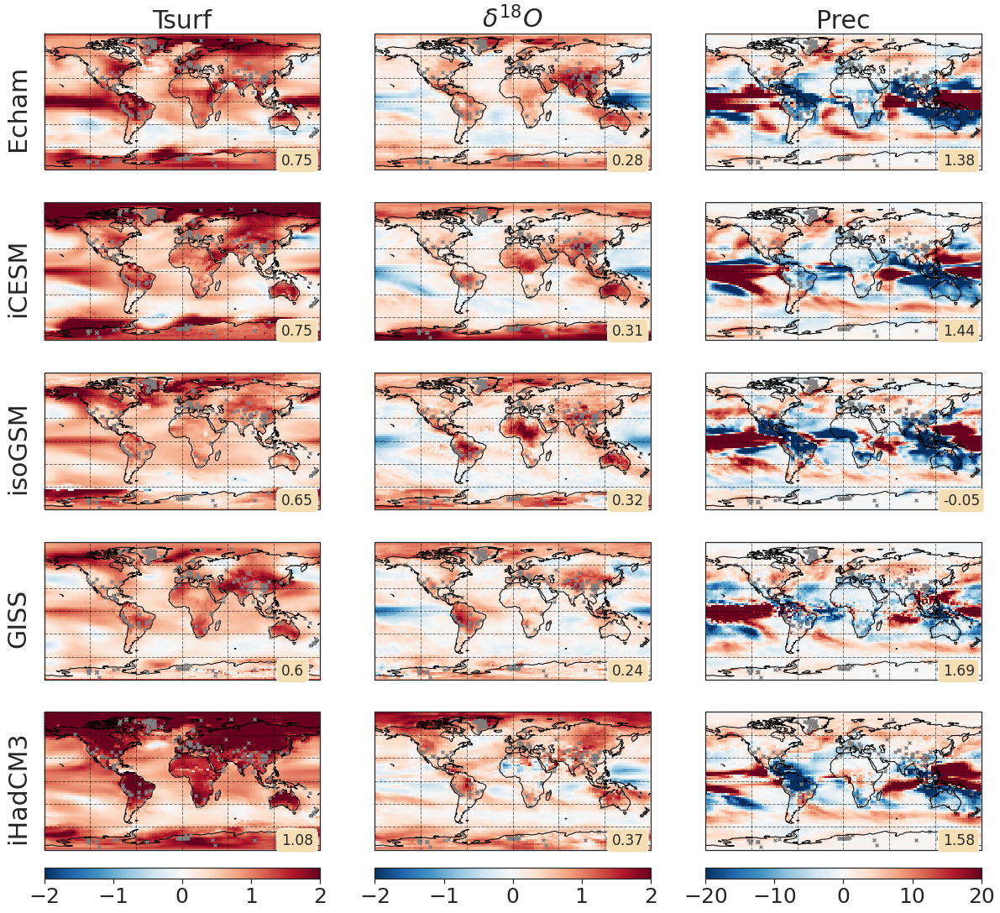

In [144]:
conf='both_nopsm'
#sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal,abs_mode=None)
both=plot(conf,vmax_temp=2,vmax_d18=2,vmax_prec=20,proxies=proxies,abs_mode='_A',loaded_dict=loaded_dict2,cmap='RdBu_r')

In [145]:
both.savefig('/home/mchoblet/plots_thesis/5_2/kernel_both.pdf', dpi='figure', format='pdf', metadata=None,
        bbox_inches='tight', pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None,
       )

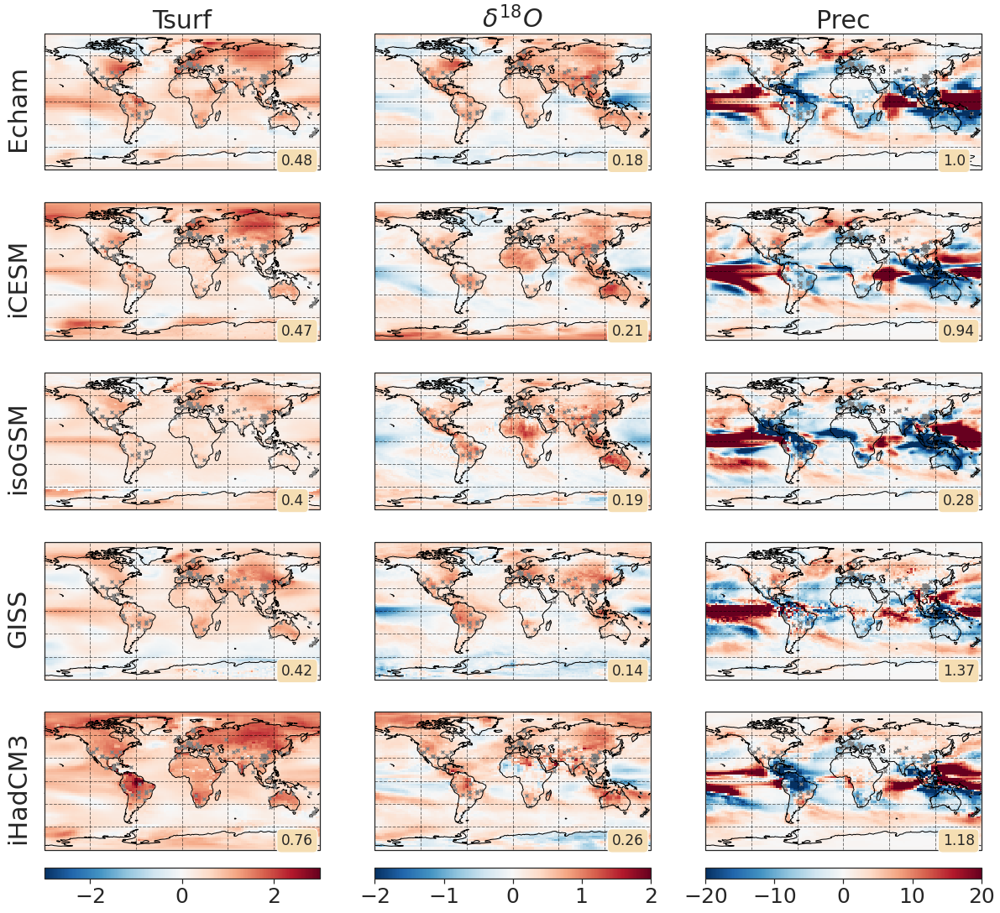

In [146]:
conf='sisal_nopsm'
#sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal,abs_mode=None)
sisal_0=plot(conf,vmax_temp=3,vmax_d18=2,vmax_prec=20,proxies=sisal,abs_mode='_A',loaded_dict=loaded_dict2,cmap='RdBu_r')

In [147]:
sisal_0.savefig('/home/mchoblet/plots_thesis/5_2/kernel_sisal.pdf', dpi='figure', format='pdf', metadata=None,
        bbox_inches='tight', pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None,
       )

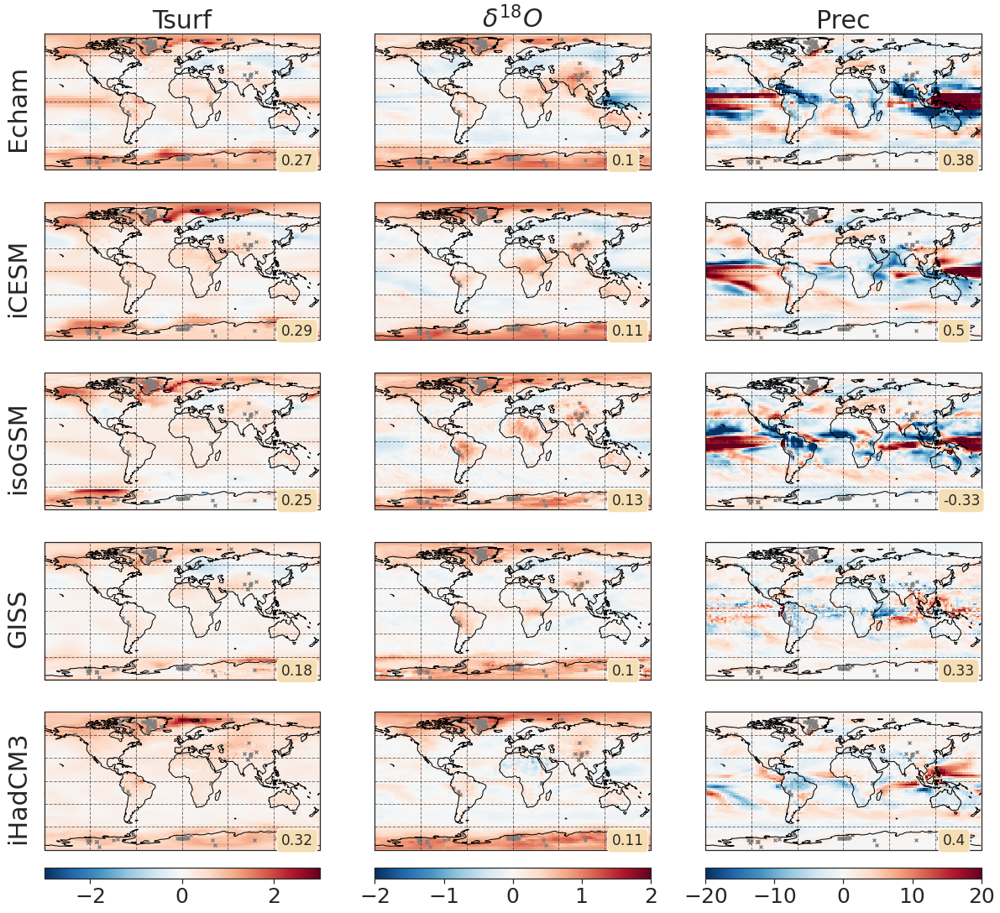

In [148]:
conf='iso_nopsm'
#sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal,abs_mode=None)
iso_0=plot(conf,vmax_temp=3,vmax_d18=2,vmax_prec=20,proxies=iso,abs_mode='_A',loaded_dict=loaded_dict2,cmap='RdBu_r')

In [149]:
iso_0.savefig('/home/mchoblet/plots_thesis/5_2/kernel_iso.pdf', dpi='figure', format='pdf', metadata=None,
        bbox_inches='tight', pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None,
       )

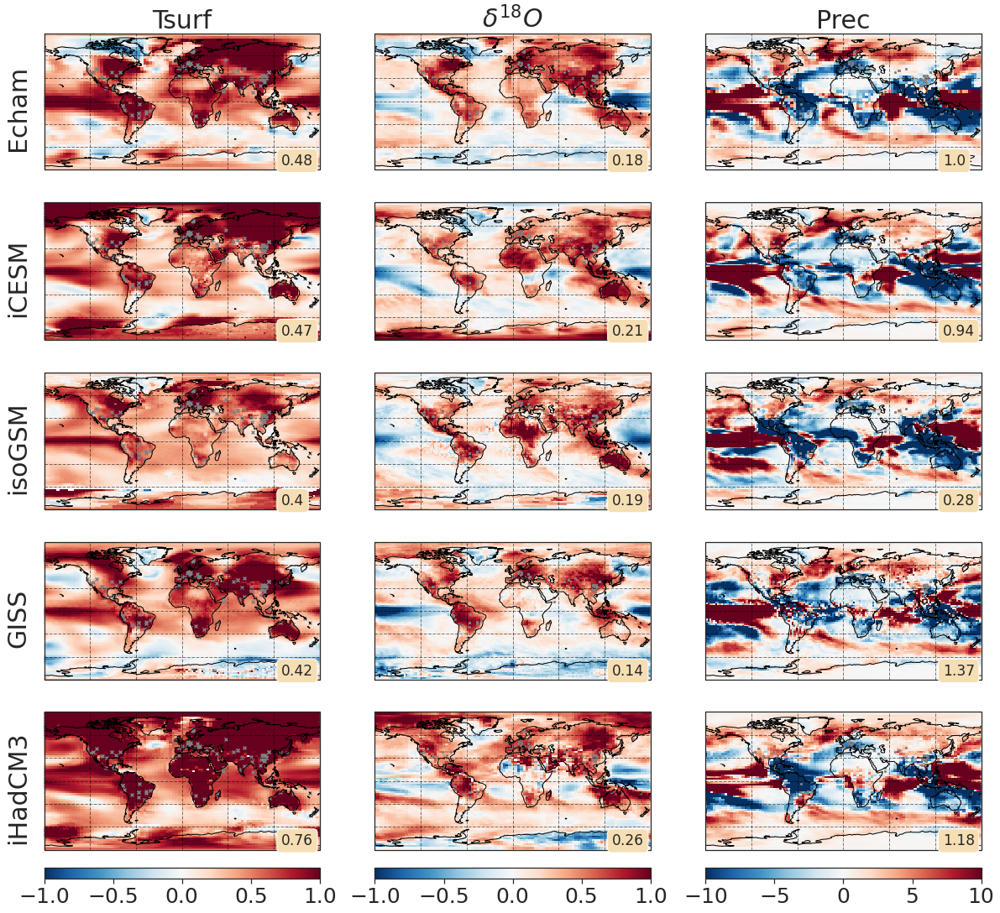

In [21]:
conf='sisal_nopsm'
#sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal,abs_mode=None)
sisal_0=plot(conf,vmax_temp=1,vmax_d18=1,vmax_prec=10,proxies=sisal,abs_mode='_A',loaded_dict=loaded_dict2,cmap='RdBu_r')

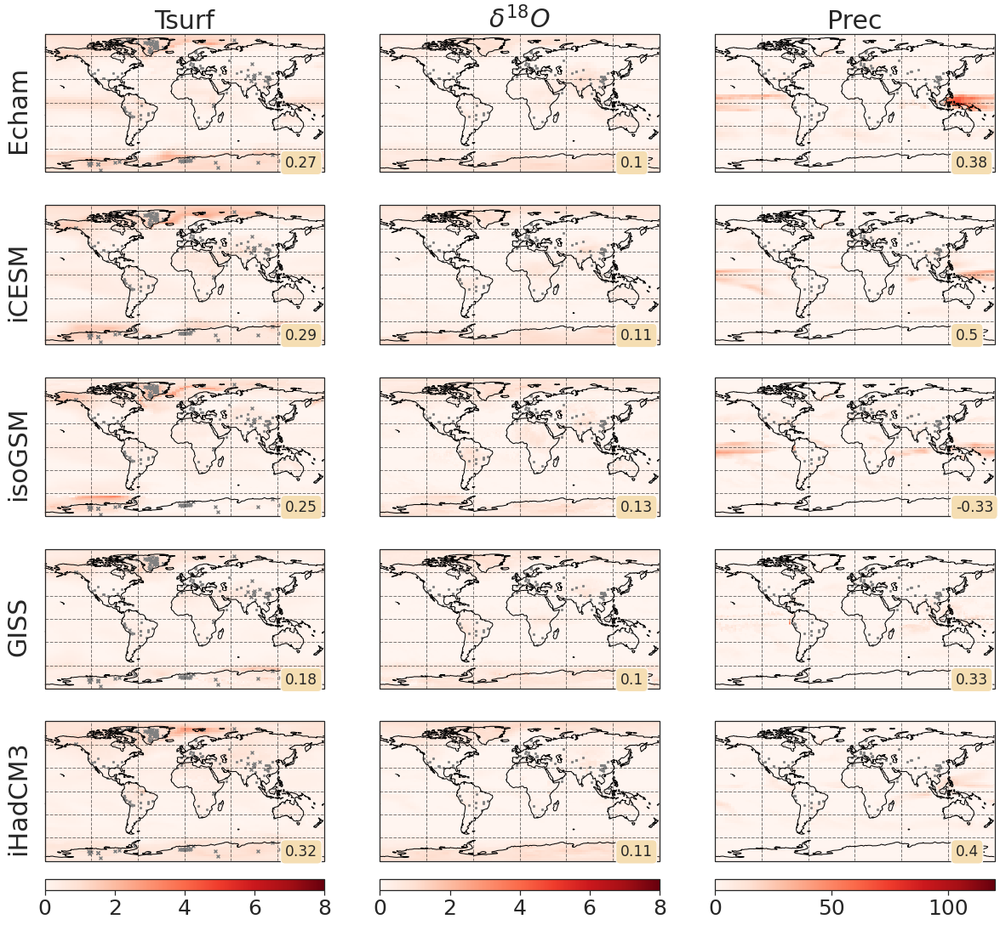

In [81]:
conf='iso_nopsm'
sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal,abs_mode='_abs')

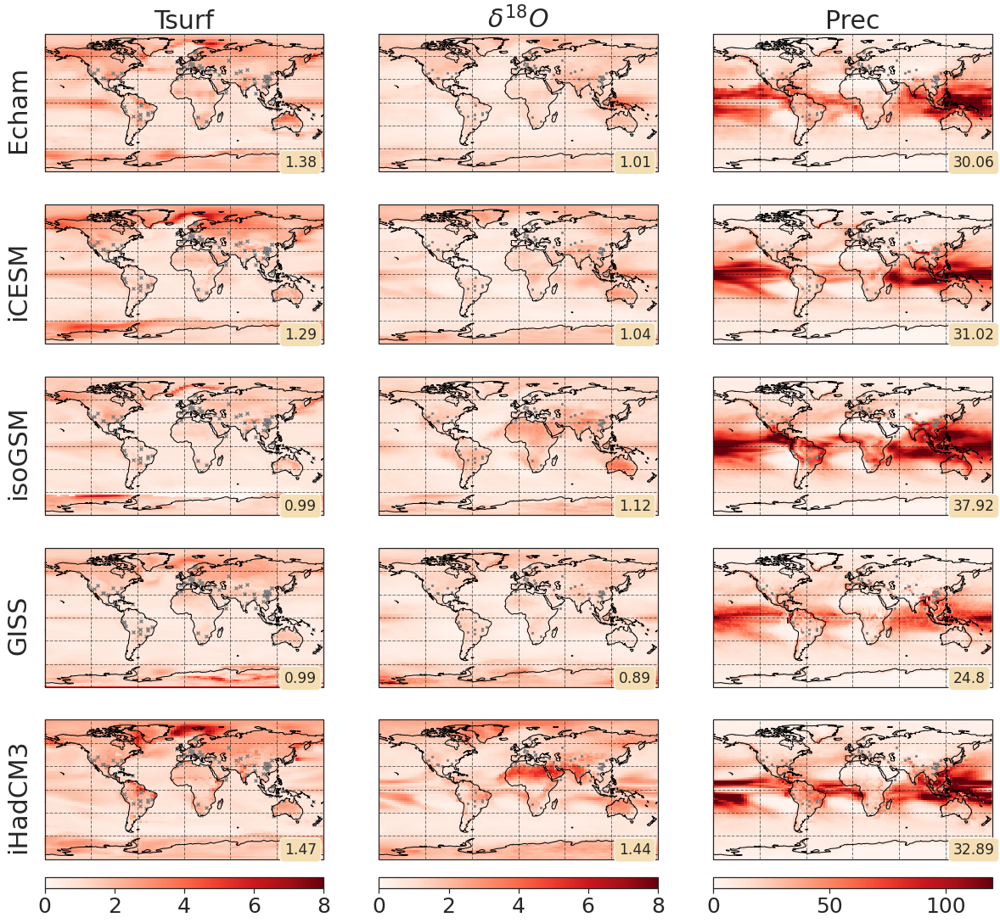

In [68]:
conf='sisal_frac_inf'
sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal)

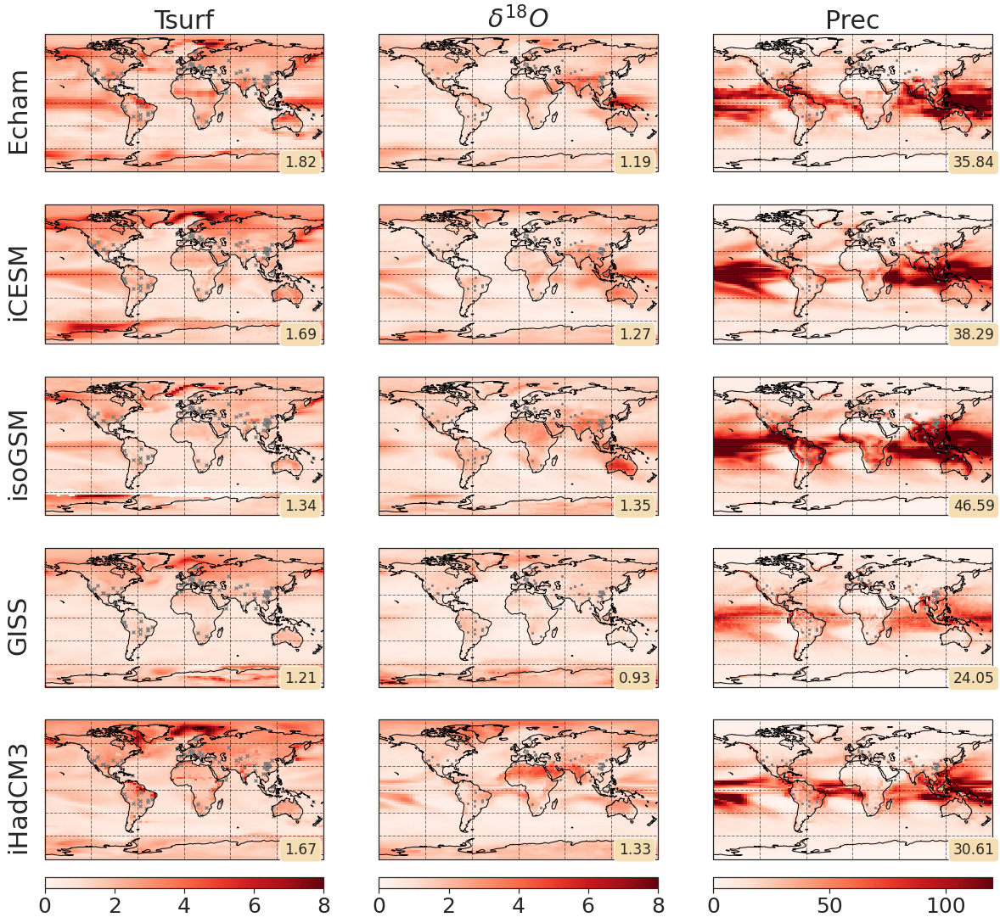

In [83]:
conf='sisal_all'
sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal)

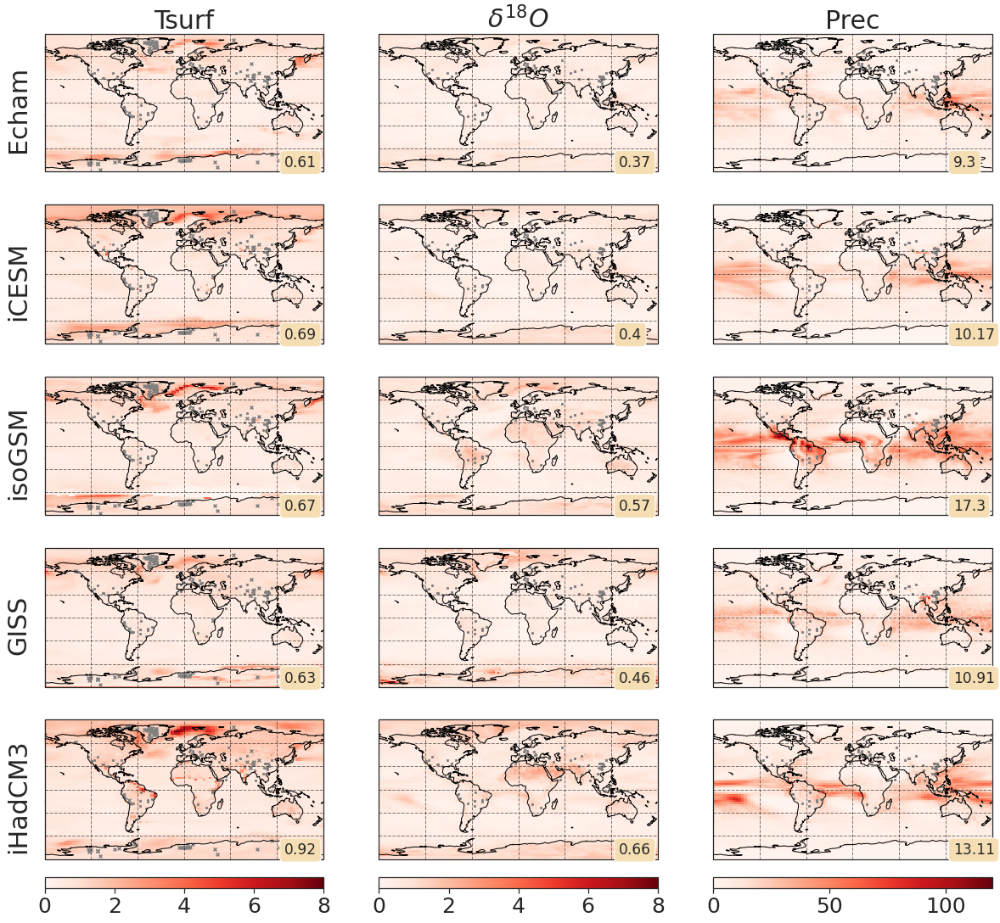

In [84]:
conf='iso_all'
sisal_0=plot(conf,vmax_temp=8,vmax_d18=8,vmax_prec=120,proxies=sisal)

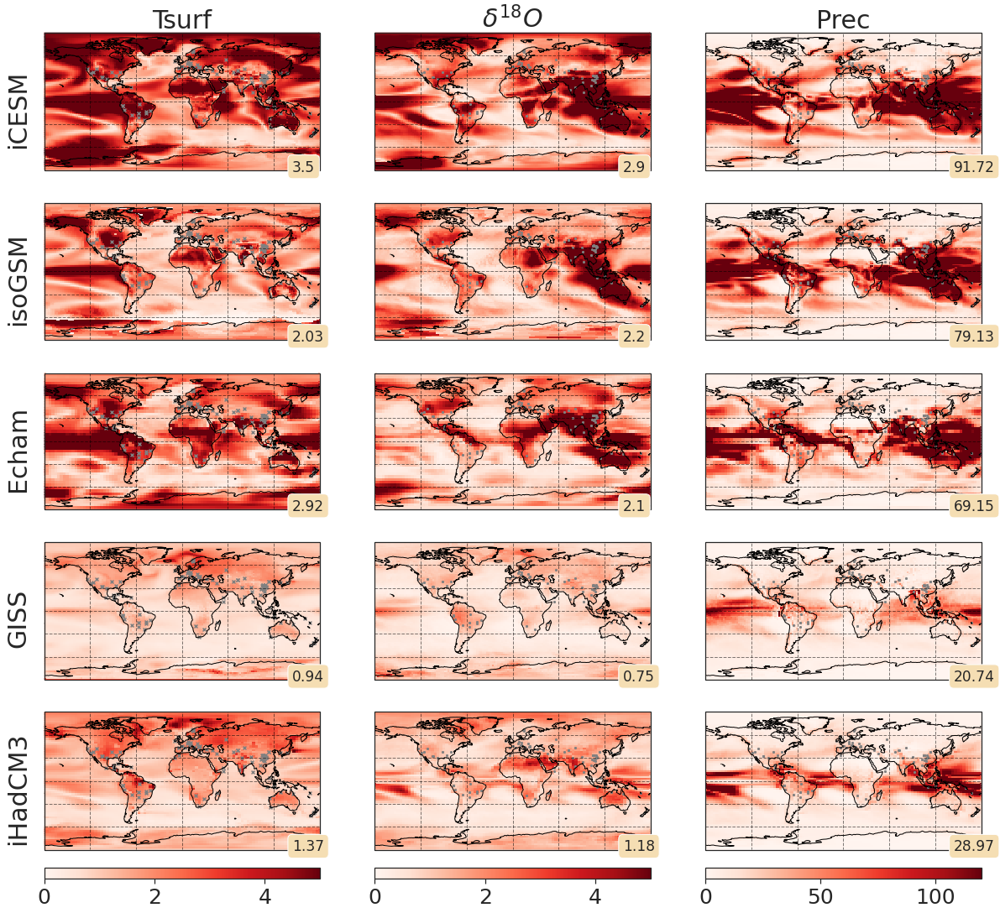

In [36]:
#ALT, nicht löschen!

conf='sisal_nopsm'
sisal_0=plot(conf,vmax_temp=5,vmax_d18=5,vmax_prec=120,proxies=sisal)

In [ ]:
#fig_comparison.savefig('/home/mchoblet/plots_thesis/5_2/model_data_comparison.pdf', dpi='figure', format='pdf', metadata=None,
        bbox_inches='tight', pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None,
       )

In [ ]:
conf='iso_nopsm'
iso_0=plot(conf,vmax_temp=10,vmax_d18=10,vmax_prec=60,proxies=iso)

In [ ]:
#fig_comparison.savefig('/home/mchoblet/plots_thesis/5_2/model_data_comparison.pdf', dpi='figure', format='pdf', metadata=None,
        bbox_inches='tight', pad_inches=0.1,
        facecolor='auto', edgecolor='auto',
        backend=None,
       )

In [ ]:
#save if result satisfactory
#fig.savefig('/home/mchoblet/plots_thesis/kalman_iso_nopsm.pdf', format='pdf',bbox_inches='tight')

In [ ]:
plot(conf,vmax_temp=10,vmax_d18=10,vmax_prec=60)

In [ ]:
#save if result satisfactory
#fig.savefig('/home/mchoblet/plots_thesis/kalman_sisal_nopsm.pdf', format='pdf',bbox_inches='tight')